# Práctica 1: Manejo de datos tabulares (parte 1)

## Machine Learning

*Aldo Cervantes Marquez*

Esta práctica consiste en realizar el analisis de una base de datos de interés. 
Se deben realizar cierto procesamiento a los datos para poder visualizarlos y comprenderlos de mejor manera, por lo que se deberá obtener lo siguiente:

* Número de atributos.
* Número de instancias.
* minímo, máximo, media.
* Desviación estándar.
* Datos atípicos.
* Datos Faltantes.
* Tipo de distribución.

In [105]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

database=pd.read_csv("C:\\Users\\aldoa\\Machine Learning\\ifood_df.csv")
print(database.shape)

(2205, 39)


<font color=#D2482A>**'ifood_df.csv'**</font> es una base de datos obtenida de [Kaggle](https://www.kaggle.com/datasets/jackdaoud/marketing-data) que consiste en la información de 2205 clientes de una compañia XYZ con datos basados en:

1. Perfil del cliente.
2. Preferencias de productos.
3. Éxito/fracaso de campañas publicitarias.
4. Frecuencia de ventas.

Incluyendo el siguiente diccionario de nomenclaturas
<div>
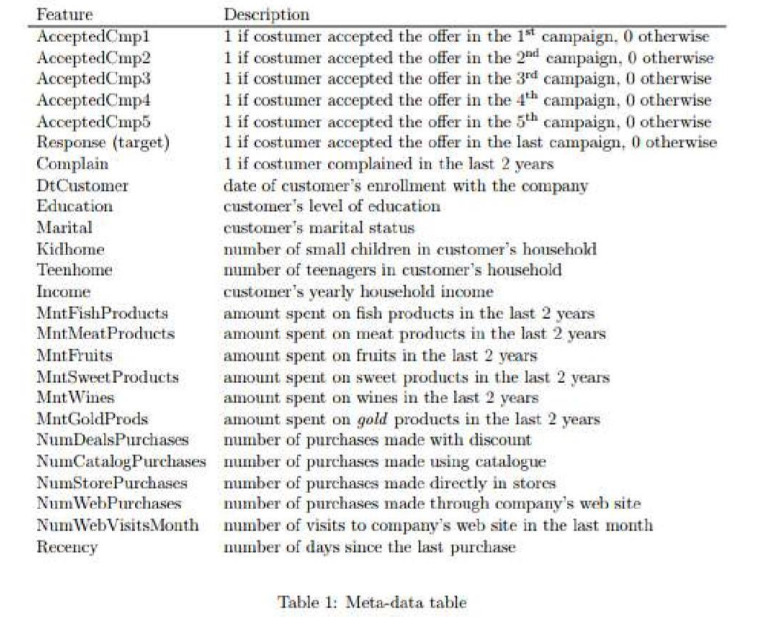
</div>

entonces en el total de dinero gastado en los productos se tiene que:


  $$ MntWines +	MntFruits +	MntMeatProducts + MntFishProducts +	MntSweetProducts = MntRegularProds$$
  
 $$ MntWines +	MntFruits +	MntMeatProducts + MntFishProducts +	MntSweetProducts + MntGoldProds = MntTotal$$

### Numero de atributos e instancias.

<div>
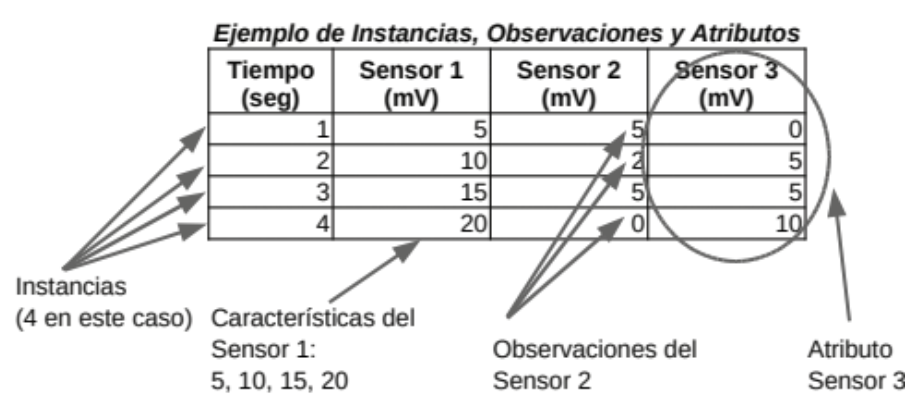
</div>
     
Al llamar la clase DataFrame podemos observar la estructura, por lo que contiene <font color=#59A090 >**2205 instancias y 39 atributos**  </font> de manera cruda

## Categorización de los datos

Sin embargo, es posible reducir el número de atributos mediante el uso de variables categoricas para el máximo nivel de estudios categorizando de la siguiente manera:

- Si no tiene educación = 0
- Si teiene basica = 1
- Si tiene estudios profesionales = 2
- Si tiene especialidad (2n_cycle)= 3
- Si tiene maestría = 4
- Si tiene doctorado = 5
- Si es desconocido (dato faltante)= 6

De igual manera su estado civil:

- Si es anonima = 0
- Si es divorciad@ = 1
- Si es casad@ = 2
- Si es solter@ = 3
- Si esta juntad@ = 4
- Si es viud@ =5
- Si se desconoce (dato faltante) = 6

In [106]:
education=database[['education_Basic','education_Graduation','education_2n Cycle','education_Master','education_PhD']]

#print(education.value_counts())
education2=pd.DataFrame({'education'})
for a in range(len(education)):
    if education.iloc[a,0]==1: # Educación Básica
        education2.loc[a]=1
    elif education.iloc[a,1]==1: # Educacion profesional
        education2.loc[a]=2
    elif education.iloc[a,2]==1: # Especialidad
        education2.loc[a]=3
    elif education.iloc[a,3]==1: # Educacion maestría
        education2.loc[a]=4
    elif education.iloc[a,4]==1: # Educacion Doctorado
        education2.loc[a]=5
    elif education.iloc[a,:].isna(): # Si no se conoce
        education2.loc[a]=6
    else:
        education2.loc[a]=0 # Si no tiene educación 
    
#print(education2.value_counts())

In [107]:
marriage=database[['marital_Divorced','marital_Married','marital_Single','marital_Together','marital_Widow']]
marriage2=pd.DataFrame({'marital_Status'})

#print(marriage.value_counts())
for a in range(len(education)):
    if marriage.iloc[a,0]==1: # Divorciad@
        marriage2.loc[a]=1
    elif marriage.iloc[a,1]==1: # Casad@
        marriage2.loc[a]=2
    elif marriage.iloc[a,2]==1: # Solter@
        marriage2.loc[a]=3
    elif marriage.iloc[a,3]==1: # Juntad@
        marriage2.loc[a]=4
    elif marriage.iloc[a,4]==1: # Viud@
        marriage2.loc[a]=5
    elif marriage.iloc[a,:].isna(): # Si no se conoce
        marriage2.loc[a]=6
    else:
        marriage2.loc[a]=0 # Si no respondio

#print(marriage2.value_counts())

In [108]:
# Igualar las bases de datos para obtener otra y agregar las categorizaciones
db2=database
db2=db2.drop(['AcceptedCmpOverall','marital_Divorced','marital_Married','marital_Single','marital_Together','marital_Widow','Z_CostContact','Z_Revenue','education_Basic','education_Graduation','education_2n Cycle','education_Master','education_PhD'],axis=1)

#frames=[db2,marriage2,education2]
#db2=pd.concat(frames)
db2['marital_Status']=marriage2
db2['education']=education2
db2['MntTotal']=db2['MntWines']+ db2['MntFruits']+db2['MntMeatProducts']+ db2['MntFishProducts']+ db2['MntSweetProducts']+db2['MntGoldProds']
db2['MntRegularProds']=db2['MntWines']+ db2['MntFruits']+db2['MntMeatProducts']+ db2['MntFishProducts']+ db2['MntSweetProducts']
print('Los atributos son: ',db2.columns)
## Calcular cantidad de atributos e instancias
instancias,atributos=db2.shape
print('La cantidad de atributos es:',atributos)

print('La cantidad de instancias es:',instancias)

Los atributos son:  Index(['Income', 'Kidhome', 'Teenhome', 'Recency', 'MntWines', 'MntFruits',
       'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts',
       'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases',
       'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth',
       'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1',
       'AcceptedCmp2', 'Complain', 'Response', 'Age', 'Customer_Days',
       'MntTotal', 'MntRegularProds', 'marital_Status', 'education'],
      dtype='object')
La cantidad de atributos es: 28
La cantidad de instancias es: 2205


- [x] **Atributos = 28**
- [x] **Instancias = 2205**

In [109]:
db2[['Income','Kidhome','Teenhome','Recency', 'MntWines', 'MntFruits',
       'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts',
       'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases',
       'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth', 'Age', 'Customer_Days',
       'MntTotal', 'MntRegularProds']].describe()

,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,Age,Customer_Days,MntTotal,MntRegularProds
count,2205.000000,2205.000000,2205.000000,2205.000000,2205.000000,2205.000000,2205.000000,2205.000000,2205.000000,2205.000000,2205.000000,2205.000000,2205.000000,2205.000000,2205.000000,2205.000000,2205.000000,2205.000000,2205.000000
mean,51622.094785,0.442177,0.506576,49.009070,306.164626,26.403175,165.312018,37.756463,27.128345,44.057143,2.318367,4.100680,2.645351,5.823583,5.336961,51.095692,2512.718367,606.821769,562.764626
std,20713.063826,0.537132,0.544380,28.932111,337.493839,39.784484,217.784507,54.824635,41.130468,51.736211,1.886107,2.737424,2.798647,3.241796,2.413535,11.705801,202.563647,601.675284,575.936911
min,1730.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,24.000000,2159.000000,5.000000,4.000000
25%,35196.000000,0.000000,0.000000,24.000000,24.000000,2.000000,16.000000,3.000000,1.000000,9.000000,1.000000,2.000000,0.000000,3.000000,3.000000,43.000000,2339.000000,69.000000,56.000000
50%,51287.000000,0.000000,0.000000,49.000000,178.000000,8.000000,68.000000,12.000000,8.000000,25.000000,2.000000,4.000000,2.000000,5.000000,6.000000,50.000000,2515.000000,397.000000,343.000000
75%,68281.000000,1.000000,1.000000,74.000000,507.000000,33.000000,232.000000,50.000000,34.000000,56.000000,3.000000,6.000000,4.000000,8.000000,7.000000,61.000000,2688.000000,1047.000000,964.000000
max,113734.000000,2.000000,2.000000,99.000000,1493.000000,199.000000,1725.000000,259.000000,262.000000,321.000000,15.000000,27.000000,28.000000,13.000000,20.000000,80.000000,2858.000000,2525.000000,2491.000000


In [110]:
## Moda
print("** Campañas y respuesta **")
print(db2[['AcceptedCmp1']].mode())
print(db2[['AcceptedCmp2']].mode())
print(db2[['AcceptedCmp3']].mode())
print(db2[['AcceptedCmp4']].mode())
print(db2[['AcceptedCmp5']].mode())
print(db2[['Response']].mode())
print("** Quejas **")
print(db2[['Complain']].mode())
print("** Educación **")
print(db2[['education']].mode())
print("** Estado civil **")
print(db2[['marital_Status']].mode())


** Campañas y respuesta **
   AcceptedCmp1
0             0
   AcceptedCmp2
0             0
   AcceptedCmp3
0             0
   AcceptedCmp4
0             0
   AcceptedCmp5
0             0
   Response
0         0
** Quejas **
   Complain
0         0
** Educación **
  education
0         2
** Estado civil **
  marital_Status
0              2


In [162]:

lab=['AcceptedCmp1','AcceptedCmp2','AcceptedCmp3','AcceptedCmp4','AcceptedCmp5']
temp=0
for xx in range(len(lab)):
    aa=db2[lab[xx]].value_counts()
    temp=temp+aa[1]/(2205)
    
print('El porcentaje de exito de las campañas es de:',(temp/(len(lab))*100),'%')



El porcentaje de exito de las campañas es de: 5.986394557823129 %


A continuación se muestran las métricas estadisticas principales.

- [x] **Media**
- [x] **Desviación estándar**
- [x] **Máximo**
- [x] **Minímo**

In [111]:
db2.isna().sum()

Income                 0
Kidhome                0
Teenhome               0
Recency                0
MntWines               0
MntFruits              0
MntMeatProducts        0
MntFishProducts        0
MntSweetProducts       0
MntGoldProds           0
NumDealsPurchases      0
NumWebPurchases        0
NumCatalogPurchases    0
NumStorePurchases      0
NumWebVisitsMonth      0
AcceptedCmp3           0
AcceptedCmp4           0
AcceptedCmp5           0
AcceptedCmp1           0
AcceptedCmp2           0
Complain               0
Response               0
Age                    0
Customer_Days          0
MntTotal               0
MntRegularProds        0
marital_Status         0
education              0
dtype: int64

Como se observa no hay datos faltantes
- [x] **Datos faltantes = 0**

## Datos atípicos




Cantidad de valores atípicos de  MntWines : (34,)
Cantidad de valores atípicos de  MntFruits : (245,)
Cantidad de valores atípicos de  MntMeatProducts : (170,)
Cantidad de valores atípicos de  MntFishProducts : (222,)
Cantidad de valores atípicos de  MntSweetProducts : (238,)
Cantidad de valores atípicos de  MntGoldProds : (204,)


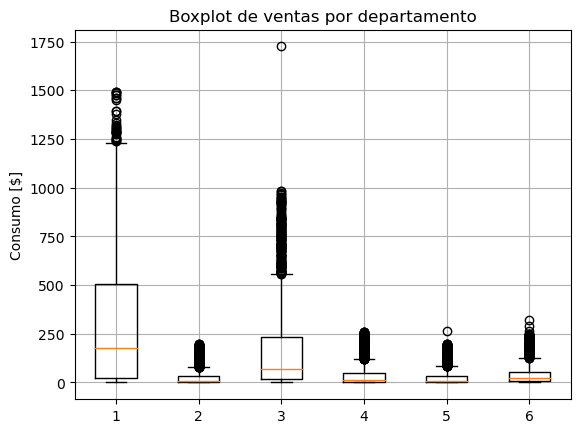

In [112]:
# Obtención de boxplot para gastos por departamento
bp1=plt.boxplot(db2[['MntWines', 'MntFruits',
       'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts',
       'MntGoldProds']])
plt.title('Boxplot de ventas por departamento')
plt.ylabel('Consumo [$]')
plt.grid()

labels=['MntWines', 'MntFruits',
       'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts',
       'MntGoldProds']
outliers1=[item.get_ydata() for item in bp1['fliers']]
for lon in range(len(outliers1)):
    print('Cantidad de valores atípicos de ',labels[lon],':',outliers1[lon].shape)

Cantidad de valores atípicos de  MntTotal : (3,)
Cantidad de valores atípicos de  MntRegularProds : (3,)


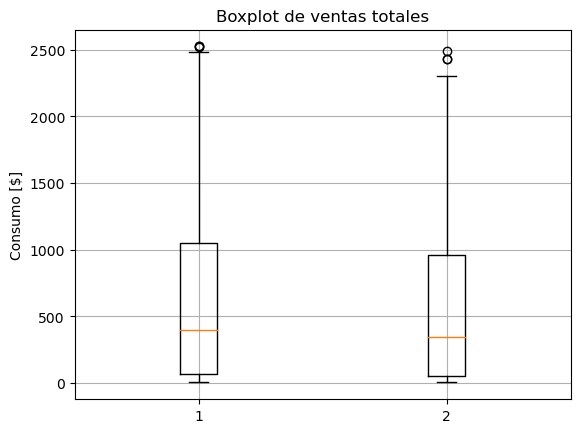

In [113]:
# Datos atípicos en totales
bp1=plt.boxplot(db2[['MntTotal', 'MntRegularProds']])
plt.title('Boxplot de ventas totales')
plt.ylabel('Consumo [$]')
plt.grid()

labels=['MntTotal', 'MntRegularProds']
outliers1=[item.get_ydata() for item in bp1['fliers']]
for lon in range(len(outliers1)):
    print('Cantidad de valores atípicos de ',labels[lon],':',outliers1[lon].shape)

Cantidad de visitas a la pagina web por mes (0,)


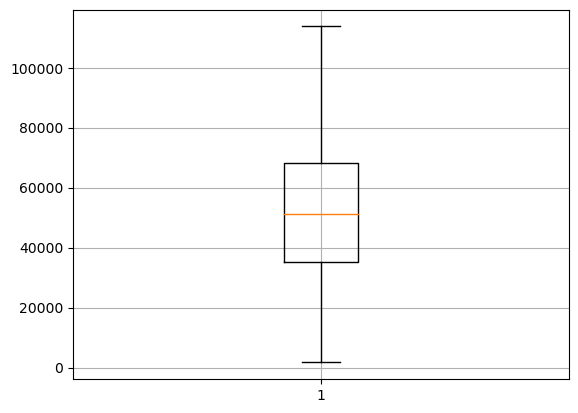

In [114]:
# Datos de boxplot para ingresos de la familia
bp1=plt.boxplot(db2['Income'])
plt.grid()

outliers1=[item.get_ydata() for item in bp1['fliers']]
for lon in range(len(outliers1)):
    print('Cantidad de visitas a la pagina web por mes',outliers1[lon].shape)

Cantidad de visitas a la pagina web por mes (8,)


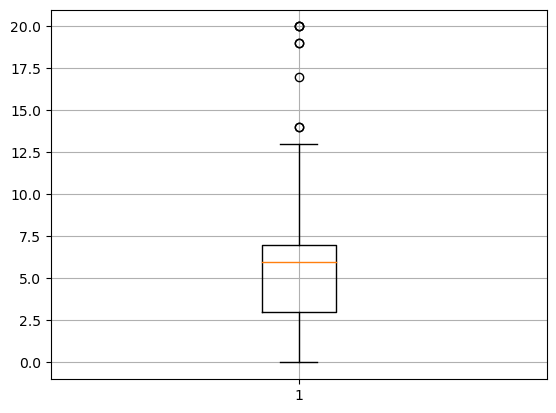

In [115]:
bp1=plt.boxplot(db2['NumWebVisitsMonth'])
plt.grid()

outliers1=[item.get_ydata() for item in bp1['fliers']]
for lon in range(len(outliers1)):
    print('Cantidad de visitas a la pagina web por mes',outliers1[lon].shape)

Cantidad de datos atipicos en ingresos (0,)


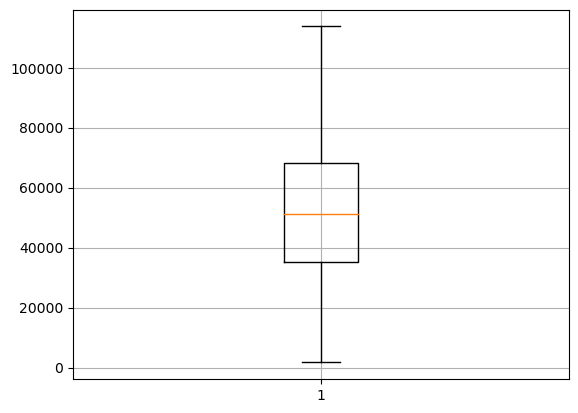

In [116]:
# Boxplot para visitas web
bp1=plt.boxplot(db2['Income'])
plt.grid()

outliers1=[item.get_ydata() for item in bp1['fliers']]
for lon in range(len(outliers1)):
    print('Cantidad de datos atipicos en ingresos',outliers1[lon].shape)

Cantidad de valores atípicos de  NumDealsPurchases : (82,)
Cantidad de valores atípicos de  NumWebPurchases : (3,)
Cantidad de valores atípicos de  NumCatalogPurchases : (20,)
Cantidad de valores atípicos de  NumStorePurchases : (0,)


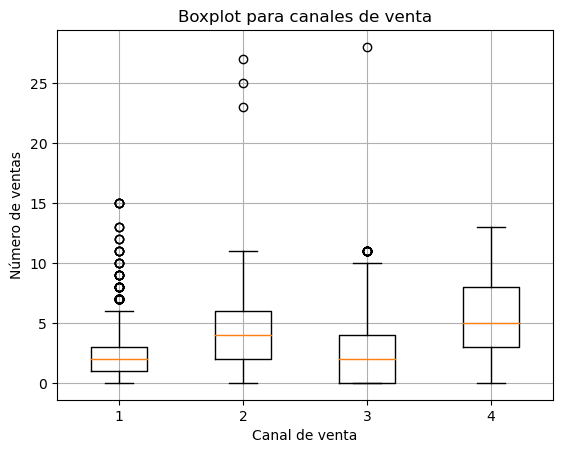

In [117]:
# Datos de boxplot para canales de venta
bp1=plt.boxplot(db2[['NumDealsPurchases', 'NumWebPurchases','NumCatalogPurchases', 'NumStorePurchases']])
plt.title('Boxplot para canales de venta')
plt.ylabel('Número de ventas')
plt.xlabel('Canal de venta')
plt.grid()
labels=['NumDealsPurchases', 'NumWebPurchases','NumCatalogPurchases', 'NumStorePurchases']
outliers1=[item.get_ydata() for item in bp1['fliers']]
for lon in range(len(outliers1)):
    print('Cantidad de valores atípicos de ',labels[lon],':',outliers1[lon].shape)

Cantidad de valores atípicos de  Kidhome : (0,)
Cantidad de valores atípicos de  Teenhome : (0,)
Cantidad de valores atípicos de  Recency : (0,)
Cantidad de valores atípicos de  Age : (0,)
Cantidad de valores atípicos de  Customer_Days : (0,)


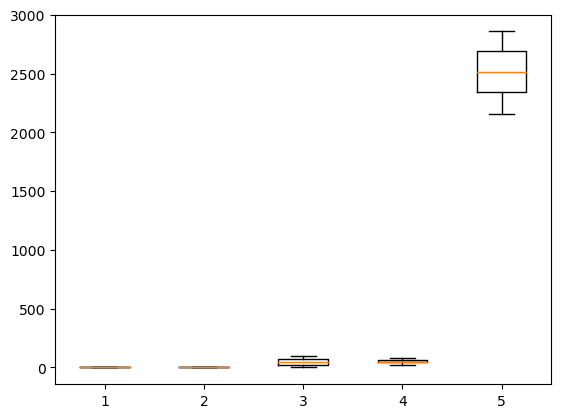

In [118]:
# Datos atipicos por Perfil del cliente
aa=['Kidhome','Teenhome','Recency', 'Age', 'Customer_Days']
bp1=plt.boxplot(db2[aa])
outliers1=[item.get_ydata() for item in bp1['fliers']]
for lon in range(len(outliers1)):
    print('Cantidad de valores atípicos de ',aa[lon],':',outliers1[lon].shape)

## Tipo de distribución

Text(0, 0.5, '')

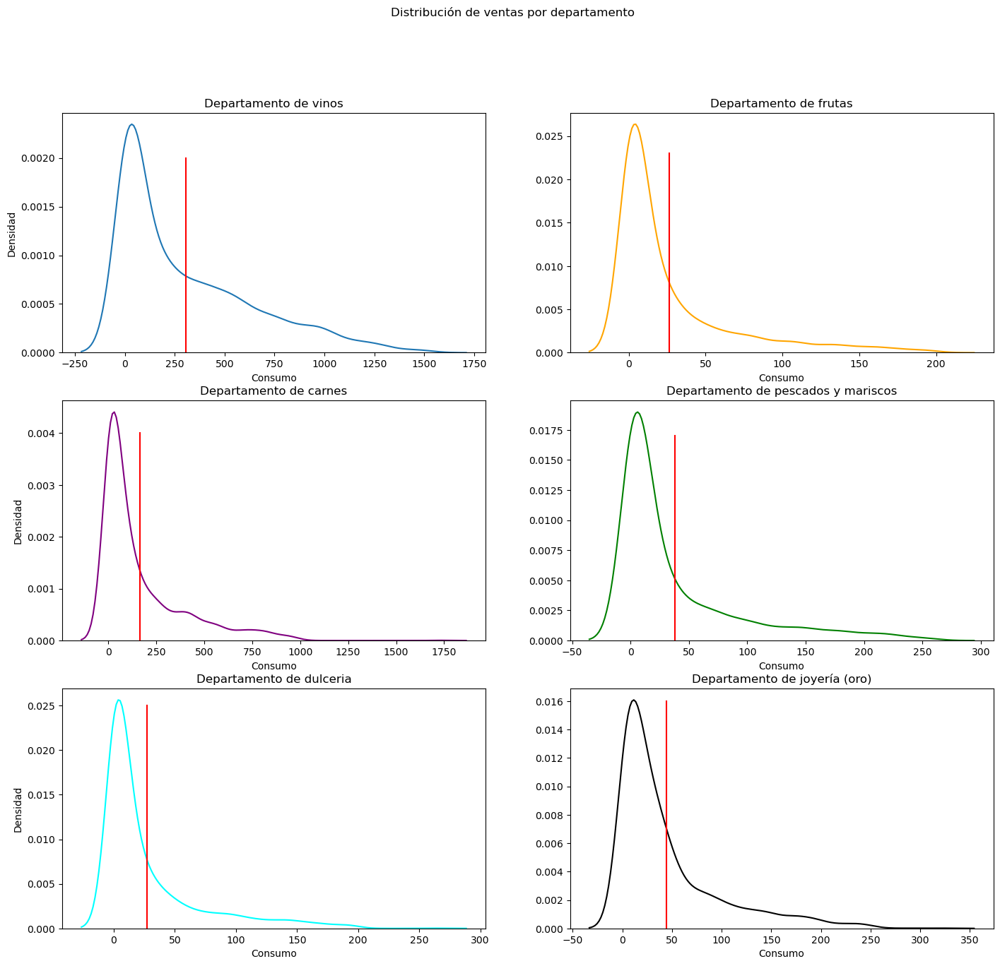

In [119]:
# Para valores ventas por departamento
# Density Transform
import seaborn as sns
fig,axes=plt.subplots(3,2,figsize=(17,15))
fig.suptitle('Distribución de ventas por departamento')
axes[0,0].set_title('Departamento de vinos')
axes[0,1].set_title('Departamento de frutas')
axes[1,0].set_title('Departamento de carnes')
axes[1,1].set_title('Departamento de pescados y mariscos')
axes[2,0].set_title('Departamento de dulceria')
axes[2,1].set_title('Departamento de joyería (oro)')


a1=['MntWines', 'MntFruits',
       'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts',
       'MntGoldProds']

sns.kdeplot(ax=axes[0,0],data=db2['MntWines'])
axes[0,0].plot([db2[a1[0]].mean(),db2[a1[0]].mean()],[0,0.0020],color='red')
axes[0,0].set_xlabel('Consumo')
axes[0,0].set_ylabel('Densidad')
#axes[0,0].set_xlim([0,db2[a1[0]].max()])

sns.kdeplot(ax=axes[0,1],data=db2['MntFruits'],color='orange')
axes[0,1].plot([db2[a1[1]].mean(),db2[a1[1]].mean()],[0,0.023],color='red')
axes[0,1].set_xlabel('Consumo')
axes[0,1].set_ylabel('')

sns.kdeplot(ax=axes[1,0],data=db2['MntMeatProducts'],color='purple')
axes[1,0].plot([db2[a1[2]].mean(),db2[a1[2]].mean()],[0,0.0040],color='red')
axes[1,0].set_xlabel('Consumo')
axes[1,0].set_ylabel('Densidad')

sns.kdeplot(ax=axes[1,1],data=db2['MntFishProducts'],color='green')
axes[1,1].plot([db2[a1[3]].mean(),db2[a1[3]].mean()],[0,0.0170],color='red')
axes[1,1].set_xlabel('Consumo')
axes[1,1].set_ylabel('')

sns.kdeplot(ax=axes[2,0],data=db2['MntSweetProducts'],color='cyan')
axes[2,0].plot([db2[a1[4]].mean(),db2[a1[4]].mean()],[0,0.0250],color='red')
axes[2,0].set_xlabel('Consumo')
axes[2,0].set_ylabel('Densidad')

sns.kdeplot(ax=axes[2,1],data=db2['MntGoldProds'],color='black')
axes[2,1].plot([db2[a1[5]].mean(),db2[a1[5]].mean()],[0,0.0160],color='red')
axes[2,1].set_xlabel('Consumo')
axes[2,1].set_ylabel('')
#sns.kdeplot(ax=axes[0,1],db2['MntWines'])




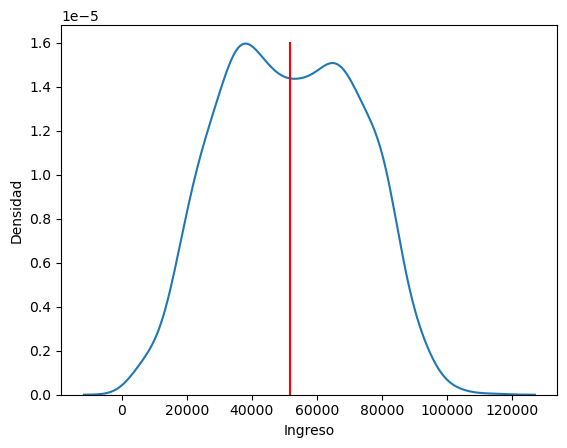

In [120]:
# Distribución de ingresos
#fig,axes=plt.subplots(1,1)
#fig.suptitle('Distribución de Ingresos')
ax= sns.kdeplot(db2['Income'])
#axes[0].set_xlabel('Ingreso')
ax.set(xlabel='Ingreso',ylabel='Densidad')
ax.plot([db2['Income'].mean(),db2['Income'].mean()],[0,0.0000160],color='red')
plt.show()

Text(0, 0.5, '')

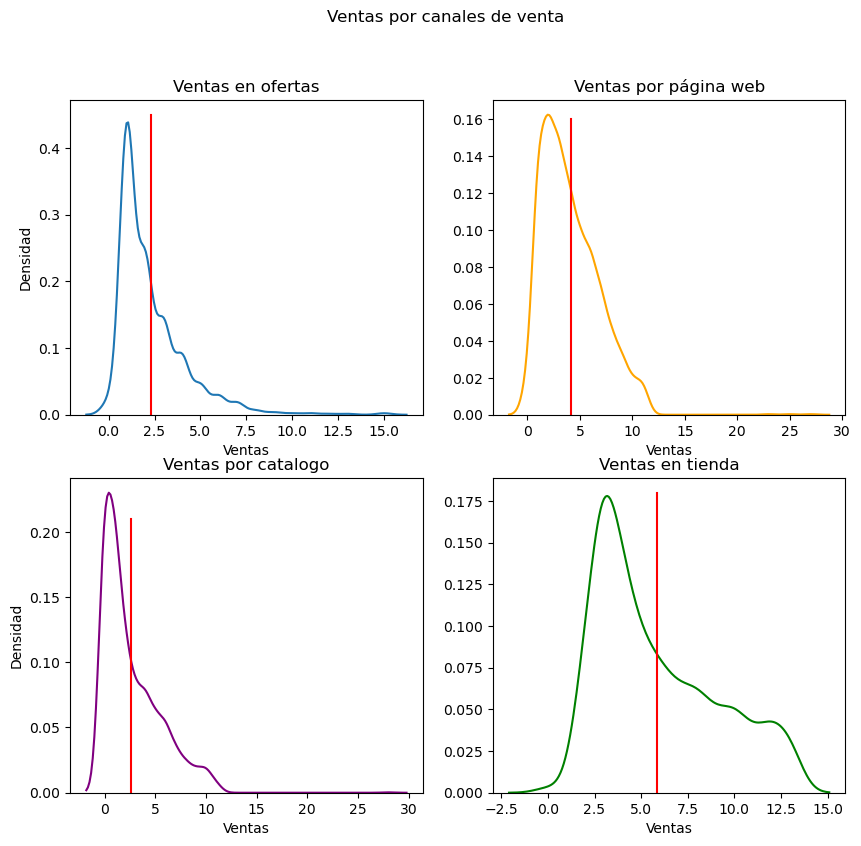

In [121]:
# Distribución de los canales de venta
a2=['NumDealsPurchases', 'NumWebPurchases','NumCatalogPurchases', 'NumStorePurchases']

fig,axes=plt.subplots(2,2,figsize=(10,9))
fig.suptitle('Ventas por canales de venta')
axes[0,0].set_title('Ventas en ofertas')
axes[0,1].set_title('Ventas por página web')
axes[1,0].set_title('Ventas por catalogo')
axes[1,1].set_title('Ventas en tienda')




sns.kdeplot(ax=axes[0,0],data=db2[a2[0]])
axes[0,0].plot([db2[a2[0]].mean(),db2[a2[0]].mean()],[0,0.45],color='red')
axes[0,0].set_xlabel('Ventas')
axes[0,0].set_ylabel('Densidad')

sns.kdeplot(ax=axes[0,1],data=db2[a2[1]],color='orange')
axes[0,1].plot([db2[a2[1]].mean(),db2[a2[1]].mean()],[0,0.16],color='red')
axes[0,1].set_xlabel('Ventas')
axes[0,1].set_ylabel('')

sns.kdeplot(ax=axes[1,0],data=db2[a2[2]],color='purple')
axes[1,0].plot([db2[a2[2]].mean(),db2[a2[2]].mean()],[0,0.21],color='red')
axes[1,0].set_xlabel('Ventas')
axes[1,0].set_ylabel('Densidad')

sns.kdeplot(ax=axes[1,1],data=db2[a2[3]],color='green')
axes[1,1].plot([db2[a2[3]].mean(),db2[a2[3]].mean()],[0,0.18],color='red')
axes[1,1].set_xlabel('Ventas')
axes[1,1].set_ylabel('')

#sns.kdeplot(ax=axes[0,1],db2['MntWines'])


Text(0, 0.5, '')

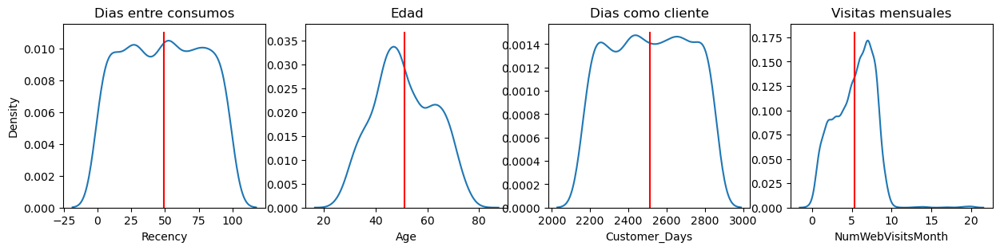

In [122]:
# Distribución por perfil del cliente

a2=['Recency', 'Age', 'Customer_Days', 'NumWebVisitsMonth']

fig,axes=plt.subplots(1,4,figsize=(15,3))

#fig.suptitle('Perfil del cliente')
axes[0].set_title('Dias entre consumos')
axes[1].set_title('Edad')
axes[2].set_title('Dias como cliente')
axes[3].set_title('Visitas mensuales')

sns.kdeplot(ax=axes[0],data=db2[a2[0]])
axes[0].plot([db2[a2[0]].mean(),db2[a2[0]].mean()],[0,0.011],color='red')

sns.kdeplot(ax=axes[1],data=db2[a2[1]])
axes[1].plot([db2[a2[1]].mean(),db2[a2[1]].mean()],[0,0.0367],color='red')
axes[1].set_ylabel('')

sns.kdeplot(ax=axes[2],data=db2[a2[2]])
axes[2].plot([db2[a2[2]].mean(),db2[a2[2]].mean()],[0,0.0015],color='red')
axes[2].set_ylabel('')

sns.kdeplot(ax=axes[3],data=db2[a2[3]])
axes[3].plot([db2[a2[3]].mean(),db2[a2[3]].mean()],[0,0.18],color='red')
axes[3].set_ylabel('')


Text(0, 0.5, '')

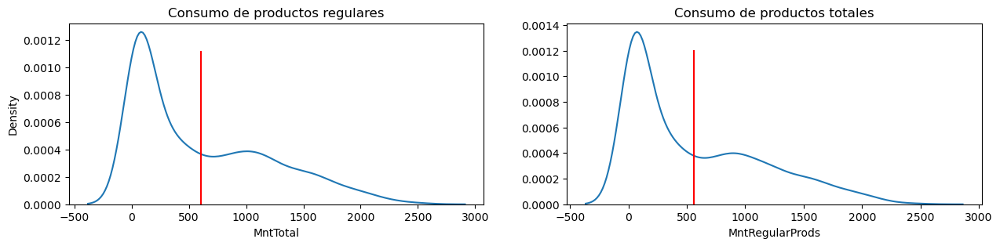

In [123]:
# Distribución de totales
a2=['MntTotal', 'MntRegularProds']

fig,axes=plt.subplots(1,2,figsize=(15,3))

#fig.suptitle('Perfil del cliente')
axes[0].set_title('Consumo de productos regulares')
axes[1].set_title('Consumo de productos totales')

sns.kdeplot(ax=axes[0],data=db2[a2[0]])
axes[0].plot([db2[a2[0]].mean(),db2[a2[0]].mean()],[0,0.00111],color='red')

sns.kdeplot(ax=axes[1],data=db2[a2[1]])
axes[1].plot([db2[a2[1]].mean(),db2[a2[1]].mean()],[0,0.0012],color='red')
axes[1].set_ylabel('')


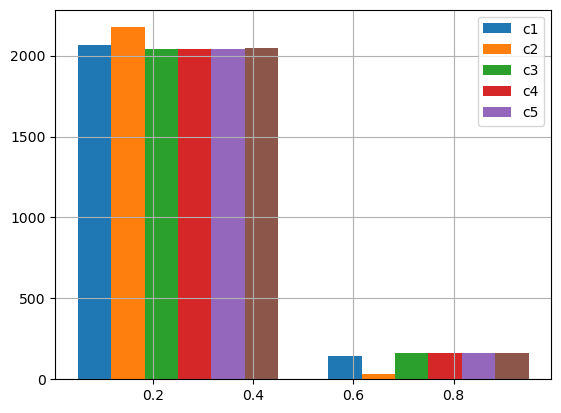

In [154]:
# Histogramas de campañas
plt.hist(db2[['AcceptedCmp1','AcceptedCmp2','AcceptedCmp3'
              ,'AcceptedCmp4','AcceptedCmp4','AcceptedCmp5']],bins=2,histtype='bar',
         label=['c1','c2','c3','c4','c5'])
plt.legend(prop={'size': 10})
plt.grid()

# Librería ggplot (Parte 2)

Visitar la página oficial [ggplot](https://ggplot2.tidyverse.org/) y con ayuda de [TWDSC](https://towardsdatascience.com/data-visualization-in-python-like-in-rs-ggplot2-bc62f8debbf5) se puede desgargar mediante la librería de **Plotnine**. 

Tiene una alta correlación con el lenguaje R por lo que hay varias funciones que son realizadas de otra manera o no se pueden realizar, la versión es le 3.4.0




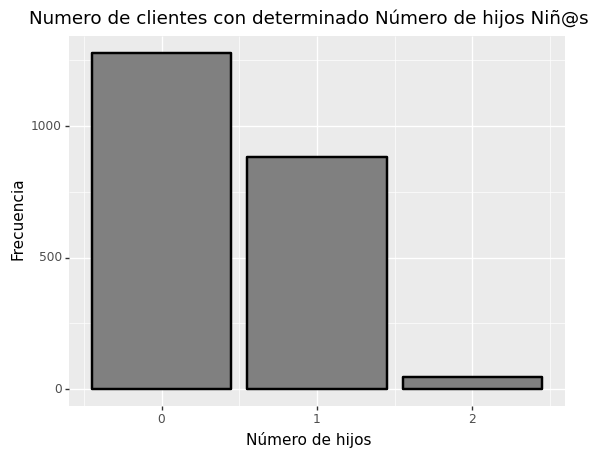

<ggplot: (174013262583)>

In [124]:
from plotnine import *
# 1 histograma
(ggplot(db2)+aes(x='Kidhome')+geom_bar(size=1,fill='gray',color='black')+labs(title='Numero de clientes con determinado Número de hijos Niñ@s'
                                                     ,x='Número de hijos',y='Frecuencia'))

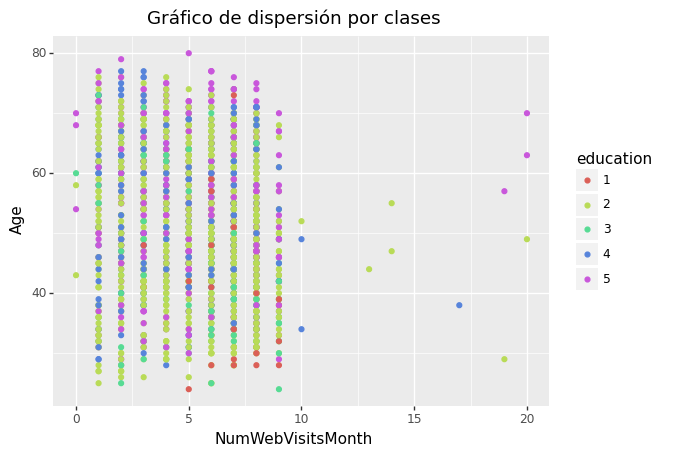

<ggplot: (174013294165)>

In [125]:
# 2 Dispersion por clases
(ggplot(db2)+aes(x='NumWebVisitsMonth',y='Age',color='education')+geom_point()+labs(title='Gráfico de dispersión por clases'))

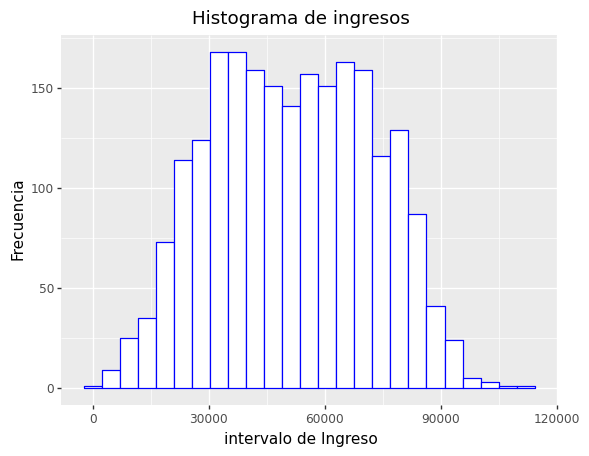

<ggplot: (174013293081)>

In [126]:
# 3 Histogram
(ggplot(db2)+geom_histogram(aes(x='Income'),bins=25,fill='white',color='blue')+
 labs(title='Histograma de ingresos',x='intervalo de Ingreso',y='Frecuencia'))


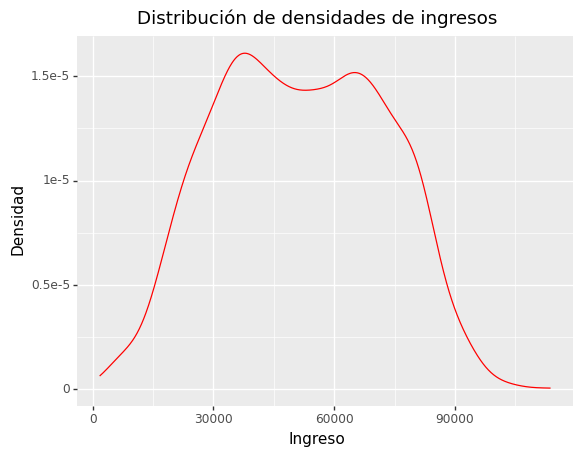

<ggplot: (174013315578)>

In [127]:
# 4 Density Curve
(ggplot(db2)+ geom_density(aes(x='Income'),color='Red')+
 labs(title='Distribución de densidades de ingresos',x='Ingreso',y='Densidad'))


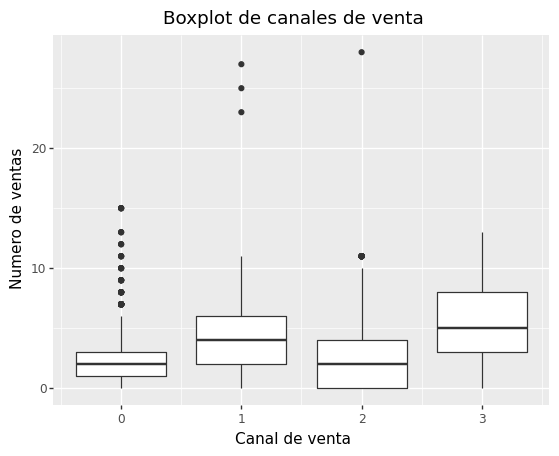

<ggplot: (174011471674)>

In [128]:
# 5 Boxplot
(ggplot(db2)+geom_boxplot(aes(x=0,y='NumDealsPurchases'))+
 geom_boxplot(aes(x=1,y='NumWebPurchases'))+
 geom_boxplot(aes(x=2,y='NumCatalogPurchases'))+
 geom_boxplot(aes(x=3,y='NumStorePurchases'))
 +labs(title='Boxplot de canales de venta',x='Canal de venta',y='Numero de ventas'))
# 'NumDealsPurchases', 'NumWebPurchases','NumCatalogPurchases', 'NumStorePurchases'

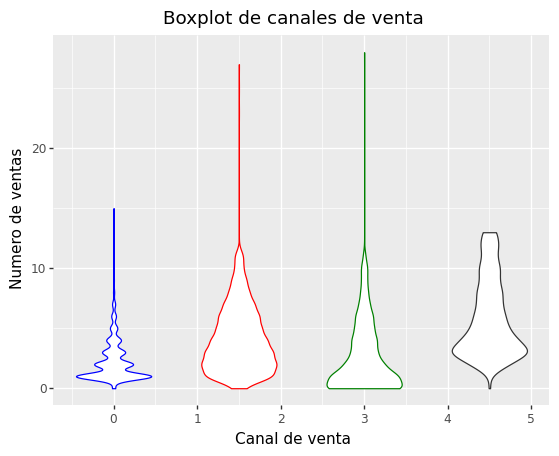

<ggplot: (174001030289)>

In [129]:
# 6 Violin

(ggplot(db2)+geom_violin(aes(x=0,y='NumDealsPurchases'),color='blue')+ 
 stat_ydensity(aes(x=1.5,y='NumWebPurchases'),color='red')+
 geom_violin(aes(x=3,y='NumCatalogPurchases'),color='green')+
 geom_violin(aes(x=4.5,y='NumStorePurchases'))
 +labs(title='Boxplot de canales de venta',x='Canal de venta',y='Numero de ventas'))



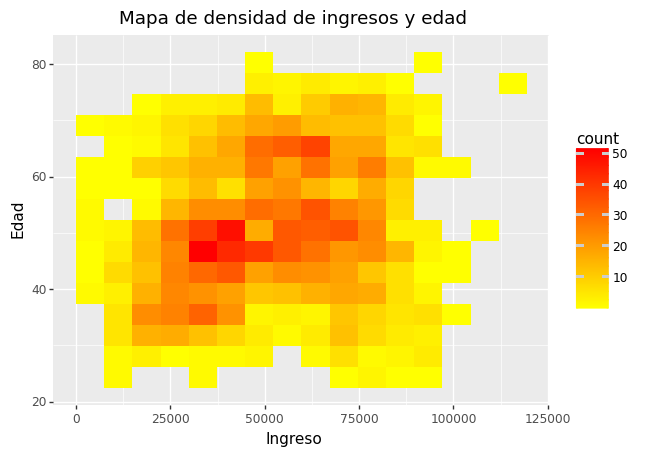

<ggplot: (174011186426)>

In [130]:
# 7 Density Map
(ggplot(db2)+aes(x='Income',y='Age')+geom_bin2d(bins=15)+scale_fill_gradient(high = "red", low = "yellow")+
labs(title='Mapa de densidad de ingresos y edad',x='Ingreso',y='Edad'))


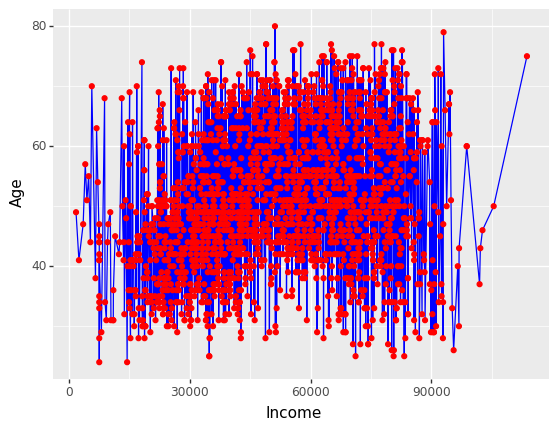

<ggplot: (174011668658)>

In [131]:
# 8 line
(ggplot(db2)+aes(x='Income',y='Age')+geom_line(color='blue')+geom_point(color='red'))


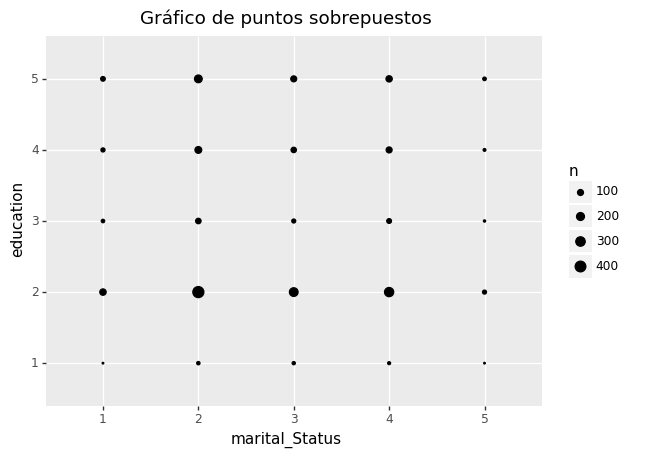

<ggplot: (174011533809)>

In [132]:
# 9 Count Overlapping points
(ggplot(db2)+aes(x='marital_Status',y='education')+geom_count()+scale_size_area(max_size=4)+
 labs(title='Gráfico de puntos sobrepuestos'))

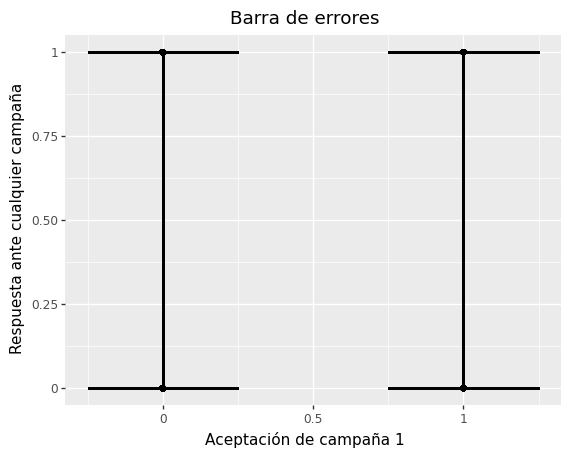

<ggplot: (174010814461)>

In [133]:
#10 error bar

(ggplot(db2)+geom_point(aes(x='AcceptedCmp1',y='Response'))+geom_errorbar(aes(x='AcceptedCmp1',ymin=0,ymax=1))
+labs(title='Barra de errores',x='Aceptación de campaña 1',y='Respuesta ante cualquier campaña'))

# Librería Altair (Parte 2)

Descarga mediane su pagina oficial: [Altair](https://altair-viz.github.io/)

Instalación mediante pip: 
<p style="text-align: center;"><em>  pip install altair vega_datasets </em></p>
Instalación para Anaconda:
<p style="text-align: center;"><em> conda install -c conda-forge altair vega_datasets </em></p>

Ambas en la version 4.2.2
Se requieren los siguientes requisitos mandatorios para poderlo instalar (dependencies):
<p style="text-align: center;"> Python 3.6 o mayor</p>
<p style="text-align: center;"><a href="https://numpy.org/">numpy</a></p>
<p style="text-align: center;"><a href="https://github.com/takluyver/entrypoints">entrypoints</a></p>
<p style="text-align: center;"><a href="https://github.com/python-jsonschema/jsonschema">jsonschema</a></p>
<p style="text-align: center;"><a href="http://pandas.pydata.org/">Pandas</a></p>
<p style="text-align: center;"><a href="https://github.com/pytoolz/toolz">Toolz</a></p>


Teniendo algunas funciones como:

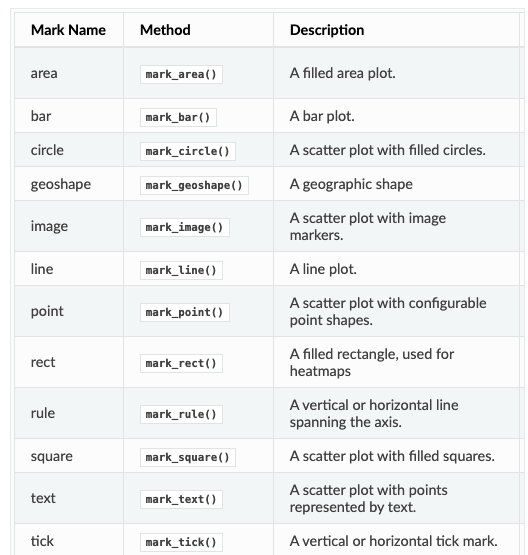


In [134]:
import altair as alt
from vega_datasets import data
## 1 Scatter plot
#iris=data.iris()
alt.Chart(db2).mark_point().encode(alt.X('Income'),alt.Y('MntTotal'),
                                    #alt.OpacityValue(1),alt.Color('Income')
                                   ).interactive()
#print(type(db2[['Income','NumWebPurchases']]))

alt.Chart(...)

In [135]:
# 2 3d Shapes
data = alt.graticule(step=[15, 15])

alt.Chart(data).mark_geoshape(stroke='black').project(
    'orthographic',
    rotate=[0, -45, 0]
)

alt.Chart(...)

In [136]:
# 3 time series con arrays
data = alt.sequence(0, 10, 0.1, as_='x')

alt.Chart(data).transform_calculate(
    y='sin(datum.x)'
).mark_line().encode(
    x='x:Q',
    y='y:Q',
)

alt.Chart(...)

In [137]:
# 4 Matriz de valores
from vega_datasets import data

#temps = data.seattle_temps()
#temps = temps[temps.date < '2010-01-15']
alt.Chart(db2).mark_rect().encode(
    alt.X('Income:Q', title='Income'),
    alt.Y('Age:Q', title='Age'),
    alt.Color('Teenhome:N', title='Numero de adolescentes')
)

alt.Chart(...)

In [138]:
# 5 Bar frequency
#data = pd.DataFrame({'name': ['a', 'b'], 'value': [4, 10]})

alt.Chart(db2).mark_bar(size=30).encode(
    x=('Kidhome:Q'),
    y='count()'
).properties(width=200)

alt.Chart(...)

In [139]:
# 6 Gráficas pulso con linea
from altair.expr import datum

stocks = data.stocks.url

base = alt.Chart(db2).encode(
    x='Income:T',
    y='MntFishProducts:Q'
    #color='symbol:N'
)

base.mark_line() + base.mark_point()

alt.layer(
  base.mark_line(),
  base.mark_point(),
  base.mark_rule()
).interactive()

alt.LayerChart(...)

In [140]:
import altair as alt
from vega_datasets import data
# Density Transform
alt.Chart(db2).transform_density(
    'MntTotal',
    as_=['MntTotal', 'density'],
).mark_area().encode(
    x="MntTotal:Q",
    y='density:Q',
)

alt.Chart(...)

In [141]:
# 8 Geo plots
from vega_datasets import data

# Data generators for the background
sphere = alt.sphere()
graticule = alt.graticule()

# Source of land data
source = alt.topo_feature(data.world_110m.url, 'countries')

# Layering and configuring the components
alt.layer(
    alt.Chart(sphere).mark_geoshape(fill='lightblue'),
    alt.Chart(graticule).mark_geoshape(stroke='white', strokeWidth=0.5),
    alt.Chart(source).mark_geoshape(fill='ForestGreen', stroke='black')
).project(
    'naturalEarth1'
).properties(width=600, height=400).configure_view(stroke=None)

alt.LayerChart(...)

In [142]:
# 9 Stream Graphs
import altair as alt
from vega_datasets import data

source = data.unemployment_across_industries.url

alt.Chart(source).mark_area().encode(
    alt.X('yearmonth(date):T',
        axis=alt.Axis(format='%Y', domain=False, tickSize=0)
    ),
    alt.Y('sum(count):Q', stack='center', axis=None),
    alt.Color('series:N',
        scale=alt.Scale(scheme='category20b')
    )
).interactive()

alt.Chart(...)

In [143]:
#10 Cumulative count chart

alt.Chart(db2).transform_window(
    cumulative_count="count()",
    cumulative_sum="sum(MntTotal)",
    sort=[{"field": "MntTotal"}],
).mark_area().encode(
    y="cumulative_sum:Q",
    x="cumulative_count:Q"
)

alt.Chart(...)